 # DL Assignment 4

-------------------------------------------------------------------------------

### Topic: Implementing Deep Neural Networks And Convolutional Neural Network using multiple Optimizers, Batch Size and Epochs

Name: Priyanka Nandkumar Gaikwad

Roll no: 23

PRN: 12210124

Cifer10 Classification (classification): https://www.tensorflow.org/datasets/catalog/cifar10



## Necessary Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import itertools
import os

2025-05-09 14:13:18.504918: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746799998.802403      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746799998.883966      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


### Load Dataset

In [2]:
(x_train, y_train), (x_test, y_test) = keras.datasets.cifar10.load_data()

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


### EDA

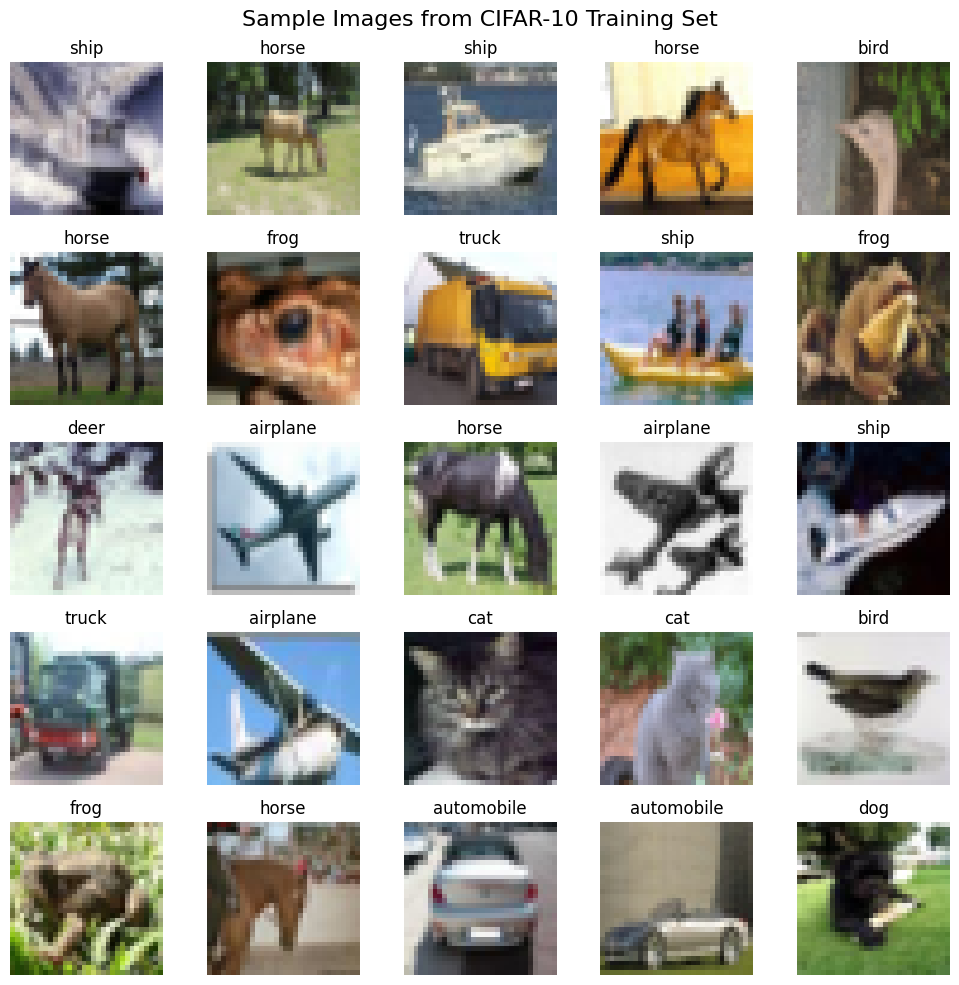

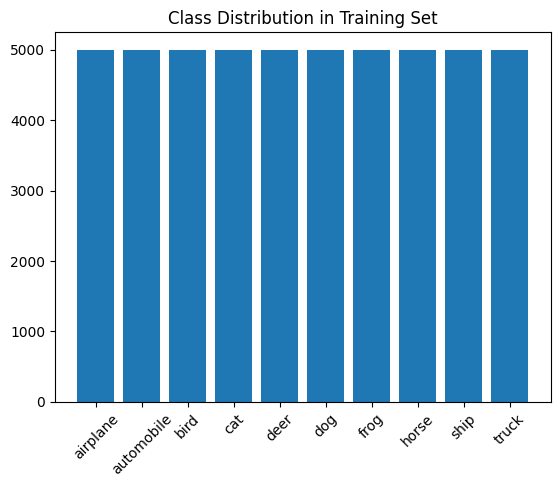

In [3]:
# CIFAR-10 class labels
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']



# Display 25 sample images with labels
plt.figure(figsize=(10, 10))
for i in range(25):
    idx = np.random.randint(0, len(x_train))
    plt.subplot(5, 5, i + 1)
    plt.imshow(x_train[idx])
    plt.title(class_names[y_train[idx][0]])
    plt.axis('off')

plt.suptitle("Sample Images from CIFAR-10 Training Set", fontsize=16)
plt.tight_layout()
plt.show()


# Distribution of classes
unique, counts = np.unique(y_train, return_counts=True)
plt.bar(class_names, counts)
plt.xticks(rotation=45)
plt.title("Class Distribution in Training Set")
plt.show()

## Preprocessing

In [6]:
# Normalize input images
x_train = x_train.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0

# One-hot encode labels
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

### Define DNN

In [5]:
def create_dnn_model(input_shape=(32, 32, 3), num_classes=10):
    model = Sequential([
        Flatten(input_shape=input_shape),

        Dense(1024, activation='relu'),
        BatchNormalization(),
        Dropout(0.3),

        Dense(512, activation='relu'),
        BatchNormalization(),
        Dropout(0.3),

        Dense(256, activation='relu'),
        Dropout(0.2),

        Dense(num_classes, activation='softmax')
    ])
    

    
    return model

In [6]:
configs = [
    {'optimizer': Adam(), 'name': 'Adam'},
    {'optimizer': SGD(learning_rate=0.01, momentum=0.9), 'name': 'SGD'},
    {'optimizer': RMSprop(learning_rate=0.001), 'name': 'RMSprop'}
]

epochs_list = [5,10, 20]
batch_sizes = [32, 64, 128]
models = {}

dnn = {}

for config in configs:
    for epochs in epochs_list:
        for batch_size in batch_sizes:
            print(f"\nTraining DNN - {config['name']}, {epochs} epochs, batch {batch_size}")
            
            # Create fresh DNN model
            model = create_dnn_model()

            # Clone optimizer
            current_optimizer = config['optimizer'].__class__.from_config(config['optimizer'].get_config())

            model.compile(optimizer=current_optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

            history = model.fit(
                x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                validation_data=(x_test, y_test),
                verbose=1
            )

            key = f"DNN_{config['name']}_{epochs}ep_{batch_size}bs"
            dnn[key] = {'model': model, 'history': history.history}


I0000 00:00:1746552487.573703      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1746552487.574398      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5
/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



Training DNN - Adam, 5 epochs, batch 32
Epoch 1/5


I0000 00:00:1746552493.637522      96 service.cc:148] XLA service 0x7e1928011990 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746552493.638497      96 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1746552493.638518      96 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1746552493.999922      96 cuda_dnn.cc:529] Loaded cuDNN version 90300


  70/1563 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1554 - loss: 2.8300

I0000 00:00:1746552496.421988      96 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1563/1563 ━━━━━━━━━━━━━━━━━━━━ 13s 5ms/step - accuracy: 0.2790 - loss: 2.1509 - val_accuracy: 0.3507 - val_loss: 1.8065
Epoch 2/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.3803 - loss: 1.7358 - val_accuracy: 0.4116 - val_loss: 1.6569
Epoch 3/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.3979 - loss: 1.6886 - val_accuracy: 0.4166 - val_loss: 1.6374
Epoch 4/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.4041 - loss: 1.6652 - val_accuracy: 0.4259 - val_loss: 1.6126
Epoch 5/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.4076 - loss: 1.6521 - val_accuracy: 0.4389 - val_loss: 1.5591

Training DNN - Adam, 5 epochs, batch 64
Epoch 1/5
782/782 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.2866 - loss: 2.1135 - val_accuracy: 0.3479 - val_loss: 1.8166
Epoch 2/5
782/782 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3924 - loss: 1.6974 - val_accuracy: 0.3788 - val_loss: 1.8107
Epoch 3/5
782/782 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.417

## DNN Performance Analysis

### Classification Reports

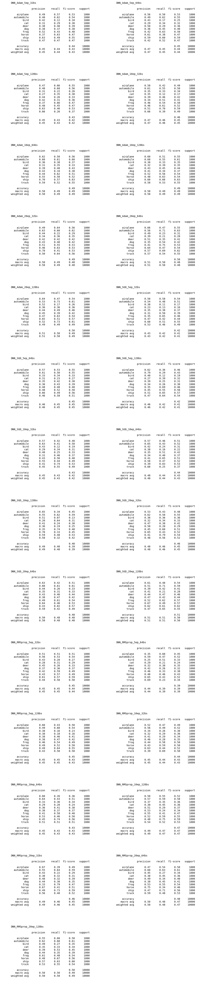

In [9]:
n_models = len(dnn)
n_cols = 2
n_rows = (n_models + n_cols - 1) // n_cols  # Calculate needed rows

plt.figure(figsize=(12, 4 * n_rows))  # Dynamic height based on number of models

for i, (model_name, model_data) in enumerate(dnn.items(), 1):
    model = model_data['model']
    y_pred = model.predict(x_test, verbose=0)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true = np.argmax(y_test, axis=1)
    
    plt.subplot(n_rows, n_cols, i)
    plt.text(0.1, 0.5, 
             f"{model_name}\n\n{classification_report(y_true, y_pred_classes, target_names=class_names, output_dict=False)}",
             fontfamily='monospace',
             fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()

### Confusion Matrices

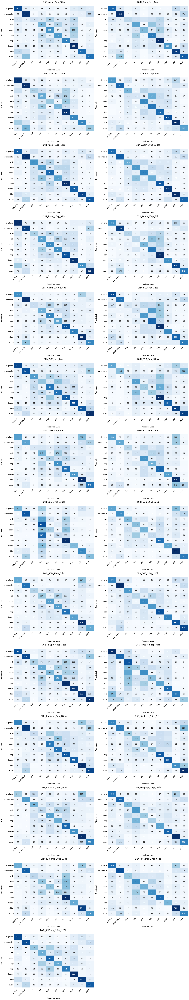

In [8]:
n_models = len(dnn)
cols = min(2, n_models)
rows = (n_models + cols - 1) // cols

plt.figure(figsize=(cols*8, rows*6))
for i, (model_name, model_data) in enumerate(dnn.items(), 1):
    model = model_data['model']
    y_pred = model.predict(x_test, verbose=0)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true = np.argmax(y_test, axis=1)
    
    cm = confusion_matrix(y_true, y_pred_classes)
    
    plt.subplot(rows, cols, i)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, 
                yticklabels=class_names,
                cbar=False)
    plt.title(model_name, pad=20)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)

plt.tight_layout()
plt.show()

## Accuracy and Loss curves


 Accuracy Curves


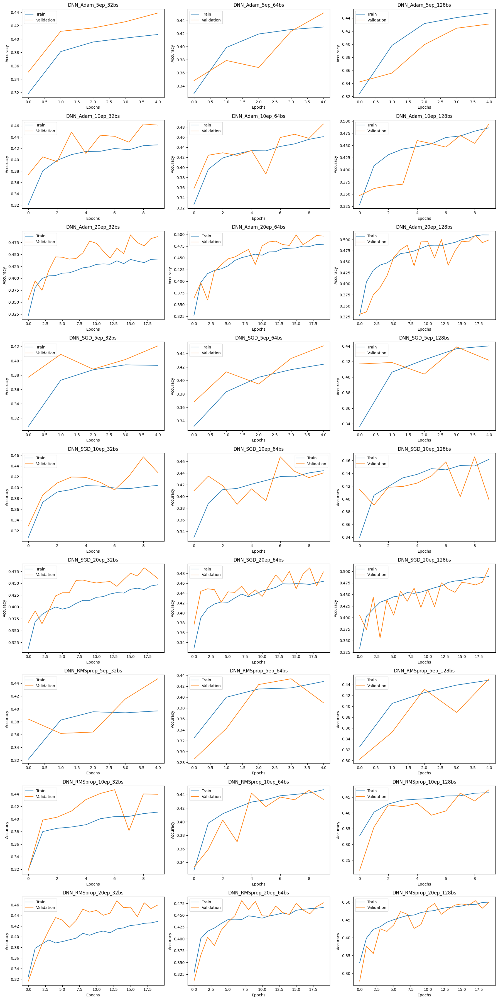


 Loss Curves


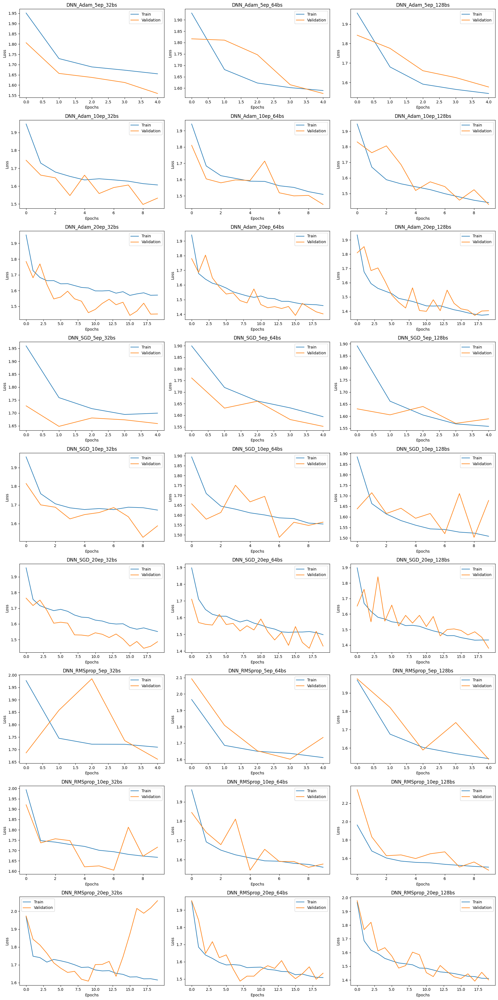

In [11]:
import math
def plot_metrics(dnn_results, metric='accuracy'):
    num_plots = len(dnn_results)
    cols = 3
    rows = math.ceil(num_plots / cols)

    plt.figure(figsize=(cols * 6, rows * 4))  # Adjust size as needed
    for i, (key, value) in enumerate(dnn_results.items()):
        history = value['history']
        plt.subplot(rows, cols, i + 1)
        plt.plot(history[metric], label='Train')
        plt.plot(history['val_' + metric], label='Validation')
        plt.title(key)
        plt.xlabel('Epochs')
        plt.ylabel(metric.capitalize())
        plt.legend()
        plt.tight_layout()
    plt.show()

# Plot accuracy
print("\n Accuracy Curves")

plot_metrics(dnn, metric='accuracy')
print("\n Loss Curves")
# Plot loss
plot_metrics(dnn, metric='loss')

### ROC-AUC

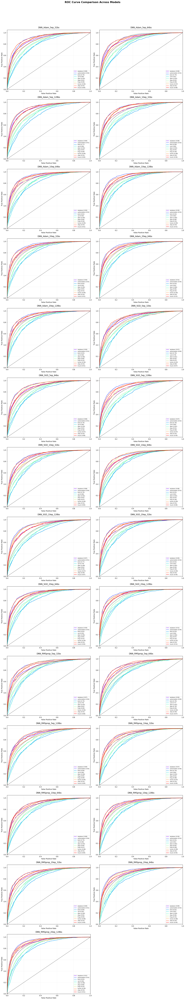


==================== MODEL AUC SUMMARY =====================

Model                          Micro AUC       Macro AUC      
------------------------------------------------------------
DNN_SGD_20ep_128bs             0.891           0.891          
DNN_RMSprop_20ep_128bs         0.889           0.887          
DNN_Adam_20ep_128bs            0.887           0.888          
DNN_Adam_20ep_64bs             0.887           0.887          
DNN_Adam_10ep_128bs            0.884           0.882          
DNN_SGD_20ep_64bs              0.883           0.883          
DNN_Adam_20ep_32bs             0.882           0.882          
DNN_Adam_10ep_64bs             0.880           0.878          
DNN_RMSprop_10ep_128bs         0.875           0.874          
DNN_RMSprop_20ep_64bs          0.873           0.875          
DNN_SGD_20ep_32bs              0.873           0.874          
DNN_RMSprop_20ep_32bs          0.865           0.869          
DNN_Adam_10ep_32bs             0.864           0.865     

In [17]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np
from math import ceil

def plot_roc_grid(models_dict, x_test, y_test, class_names, n_cols=2):
    n_models = len(models_dict)
    n_rows = ceil(n_models / n_cols)
    
    # Create figure with dynamic size
    fig_width = 8 * n_cols
    fig_height = 6 * n_rows
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(fig_width, fig_height))
    fig.suptitle('ROC Curve Comparison Across Models', y=1.02, fontsize=16, fontweight='bold')
    
    # Flatten axes if needed
    if n_models > 1:
        axs = axs.flatten()
    
    # Process each model
    for ax, (model_name, model_data) in zip(axs, models_dict.items()):
        model = model_data['model']
        y_true = np.argmax(y_test, axis=1) if y_test.ndim > 1 else y_test
        y_score = model.predict(x_test, verbose=0)
        y_test_bin = label_binarize(y_true, classes=np.arange(len(class_names)))
        
        # Compute ROC for each class
        fpr, tpr, roc_auc = {}, {}, {}
        colors = plt.cm.rainbow(np.linspace(0, 1, len(class_names)))
        
        for i, color in zip(range(len(class_names)), colors):
            fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])
            ax.plot(fpr[i], tpr[i], color=color, lw=1.5,
                    label=f'{class_names[i]} ({roc_auc[i]:.2f})')
        
        # Formatting
        ax.plot([0, 1], [0, 1], 'k--', lw=1)
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
        ax.set_xlabel('False Positive Rate', fontsize=10)
        ax.set_ylabel('True Positive Rate', fontsize=10)
        ax.set_title(model_name, fontsize=12, pad=10)
        ax.legend(loc='lower right', fontsize=8)
        ax.grid(alpha=0.2)
        
        # Add micro-average if needed
        if len(class_names) > 2:
            fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_score.ravel())
            roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
            ax.plot(fpr["micro"], tpr["micro"], color='black', linestyle=':', lw=2,
                    label=f'Micro-avg ({roc_auc["micro"]:.2f})')
    
    # Hide empty subplots
    for i in range(n_models, len(axs)):
        axs[i].axis('off')
    
    plt.tight_layout()
    plt.show()

# Generate summary statistics
def print_auc_summary(models_dict, x_test, y_test):
    print("\n" + "="*60)
    print(" MODEL AUC SUMMARY ".center(60, "="))
    print("="*60)
    
    results = []
    for model_name, model_data in models_dict.items():
        model = model_data['model']
        y_true = np.argmax(y_test, axis=1)
        y_score = model.predict(x_test, verbose=0)
        y_test_bin = label_binarize(y_true, classes=np.arange(len(class_names)))
        
        # Calculate micro-average AUC
        fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_score.ravel())
        micro_auc = auc(fpr, tpr)
        
        # Calculate macro-average AUC
        auc_scores = []
        for i in range(len(class_names)):
            fpr_i, tpr_i, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
            auc_scores.append(auc(fpr_i, tpr_i))
        macro_auc = np.mean(auc_scores)
        
        results.append((model_name, micro_auc, macro_auc))
    
    # Sort by micro AUC
    results.sort(key=lambda x: x[1], reverse=True)
    
    # Print table
    print("\n{:<30} {:<15} {:<15}".format("Model", "Micro AUC", "Macro AUC"))
    print("-"*60)
    for name, micro, macro in results:
        print("{:<30} {:<15.3f} {:<15.3f}".format(name, micro, macro))
    print("="*60)

# Usage
plot_roc_grid(dnn, x_test, y_test, class_names, n_cols=2)
print_auc_summary(dnn, x_test, y_test)

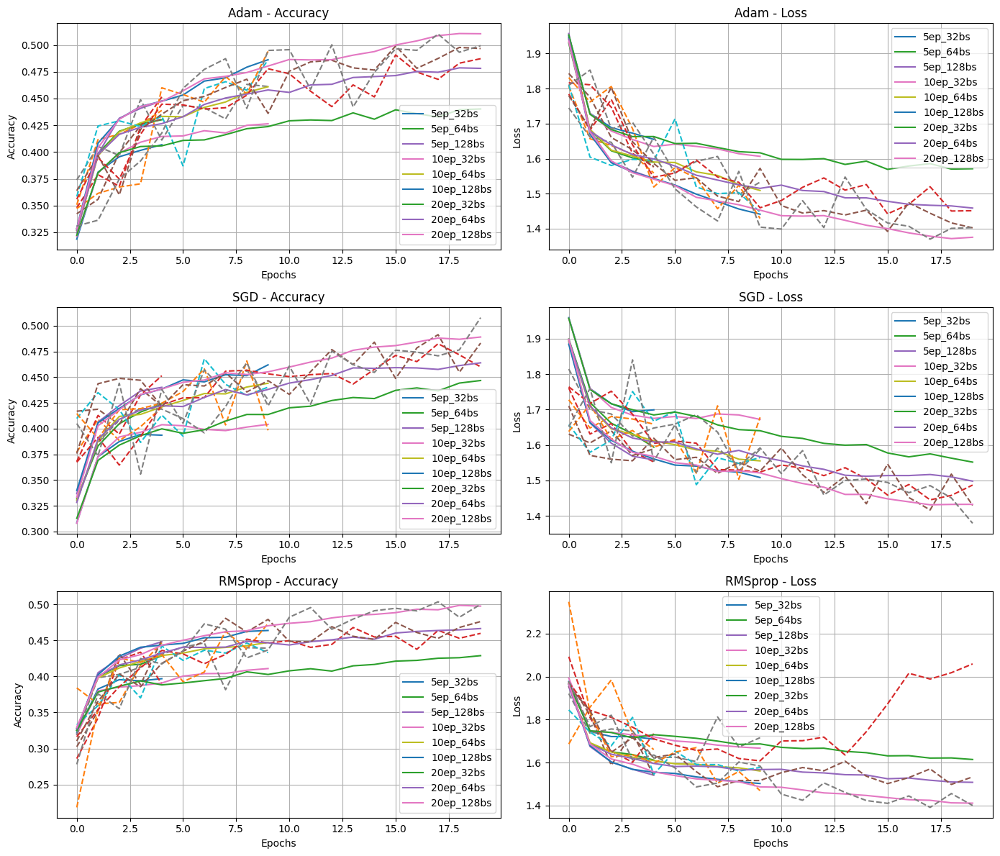

In [13]:
fig, axs = plt.subplots(3, 2, figsize=(14, 12))
optimizer_names = ['Adam', 'SGD', 'RMSprop']

for i, opt_name in enumerate(optimizer_names):
    ax_acc = axs[i][0]
    ax_loss = axs[i][1]
    ax_acc.set_title(f'{opt_name} - Accuracy')
    ax_loss.set_title(f'{opt_name} - Loss')
    
    for key in dnn:
        if f"DNN_{opt_name}" in key:
            history = dnn[key]['history']
            label = key.split('_', 2)[-1]
            ax_acc.plot(history['accuracy'], label=label)
            ax_acc.plot(history['val_accuracy'], linestyle='--')
            ax_loss.plot(history['loss'], label=label)
            ax_loss.plot(history['val_loss'], linestyle='--')
    
    ax_acc.set_ylabel('Accuracy')
    ax_loss.set_ylabel('Loss')
    ax_acc.set_xlabel('Epochs')
    ax_loss.set_xlabel('Epochs')
    ax_acc.grid(True)
    ax_loss.grid(True)
    ax_acc.legend()
    ax_loss.legend()

plt.tight_layout()
plt.show()


/tmp/ipykernel_31/3796023359.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


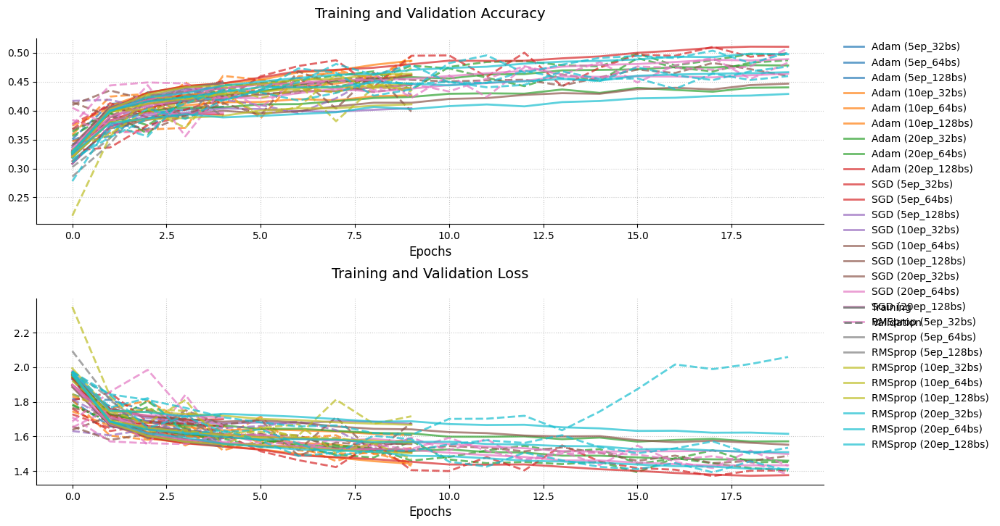

In [16]:
plt.figure(figsize=(14, 8))

# Create a grid of subplots with shared x-axis
gs = plt.GridSpec(2, 3, height_ratios=[1, 1], hspace=0.4, wspace=0.3)
ax_acc = plt.subplot(gs[0, :])  # Top row for accuracy
ax_loss = plt.subplot(gs[1, :])  # Bottom row for loss

# Custom color cycle for better distinction
colors = plt.cm.tab10(np.linspace(0, 1, len(dnn)))

for i, (key, model_data) in enumerate(dnn.items()):
    history = model_data['history']
    opt_name = key.split('_')[1]  # Get optimizer name
    label = f"{opt_name} ({key.split('_', 2)[-1]})"  # Combine optimizer and architecture
    
    # Plot accuracy
    ax_acc.plot(history['accuracy'], 
               color=colors[i], 
               linestyle='-', 
               linewidth=2, 
               alpha=0.7, 
               label=label)
    ax_acc.plot(history['val_accuracy'], 
               color=colors[i], 
               linestyle='--', 
               linewidth=2, 
               alpha=0.7)
    
    # Plot loss
    ax_loss.plot(history['loss'], 
                color=colors[i], 
                linestyle='-', 
                linewidth=2, 
                alpha=0.7, 
                label=label)
    ax_loss.plot(history['val_loss'], 
                color=colors[i], 
                linestyle='--', 
                linewidth=2, 
                alpha=0.7)

# Customize appearance
ax_acc.set_title('Training and Validation Accuracy', pad=20, fontsize=14)
ax_loss.set_title('Training and Validation Loss', pad=20, fontsize=14)

for ax in [ax_acc, ax_loss]:
    ax.set_xlabel('Epochs', fontsize=12)
    ax.grid(True, linestyle=':', alpha=0.7)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# Add legend outside the plot
handles, labels = ax_acc.get_legend_handles_labels()
unique_labels = list(dict.fromkeys(labels))  # Remove duplicates
ax_acc.legend(handles[:len(unique_labels)], unique_labels, 
             bbox_to_anchor=(1.02, 1), 
             loc='upper left', 
             borderaxespad=0.,
             frameon=False)

# Add validation indicator to legend
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color='gray', linestyle='-', lw=2),
                Line2D([0], [0], color='gray', linestyle='--', lw=2)]
ax_loss.legend(custom_lines, ['Training', 'Validation'], 
              bbox_to_anchor=(1.02, 1), 
              loc='upper left', 
              borderaxespad=0.,
              frameon=False)

plt.tight_layout()
plt.show()

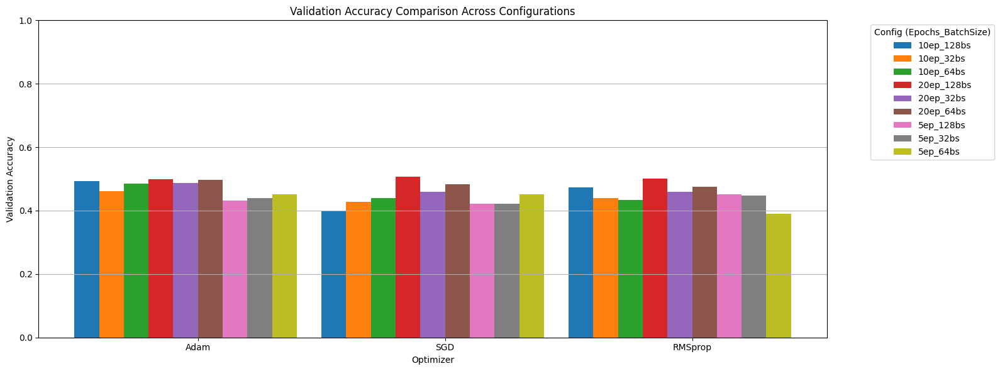

In [18]:
import matplotlib.pyplot as plt
import numpy as np

# Collect final validation accuracies for each optimizer and config
bar_data = {}

for key in dnn:
    parts = key.split('_')  # Format: DNN_Optimizer_Epochsep_Batchbs
    opt_name = parts[1]
    config_label = parts[2] + '_' + parts[3]  # e.g., 10ep_64bs
    val_acc = dnn[key]['history']['val_accuracy'][-1]

    if opt_name not in bar_data:
        bar_data[opt_name] = {}

    bar_data[opt_name][config_label] = val_acc

# Sort keys to maintain consistency
optimizers = list(bar_data.keys())
configs = sorted(list({cfg for opt in bar_data.values() for cfg in opt.keys()}))

# Prepare data matrix
val_acc_matrix = []
for opt in optimizers:
    val_acc_matrix.append([bar_data[opt].get(cfg, 0) for cfg in configs])

# Plotting
x = np.arange(len(optimizers))  # the label locations
width = 0.1  # width of individual bars

plt.figure(figsize=(16, 6))
for i, cfg in enumerate(configs):
    plt.bar(x + i * width, [val_acc_matrix[j][i] for j in range(len(optimizers))],
            width=width, label=cfg)

plt.ylabel('Validation Accuracy')
plt.xlabel('Optimizer')
plt.title('Validation Accuracy Comparison Across Configurations')
plt.xticks(x + width * (len(configs) / 2), optimizers)
plt.ylim([0, 1])
plt.legend(title='Config (Epochs_BatchSize)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


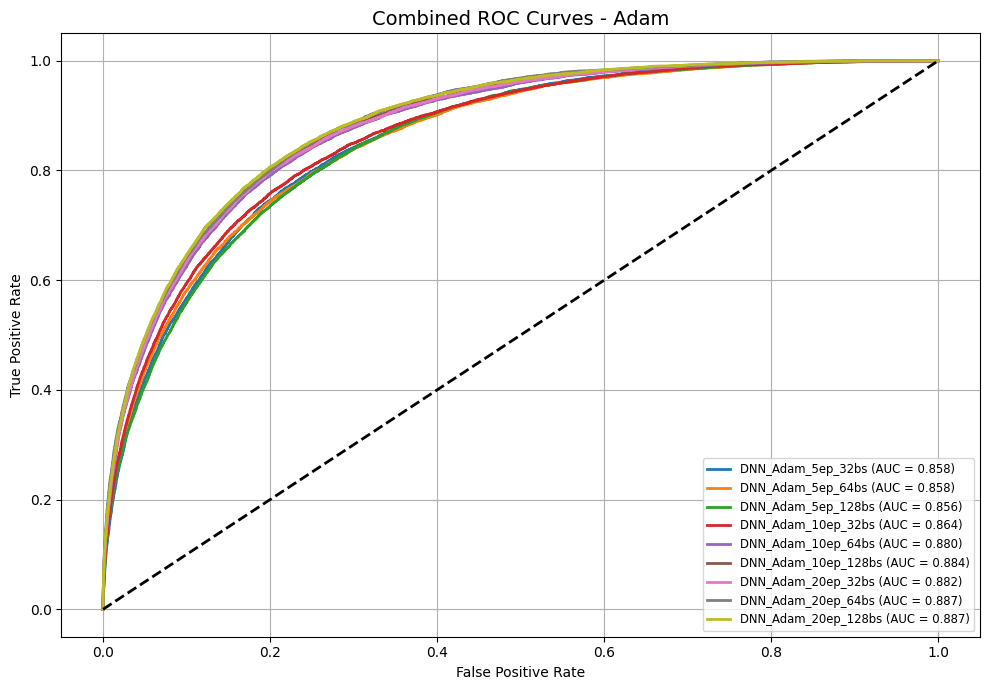

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


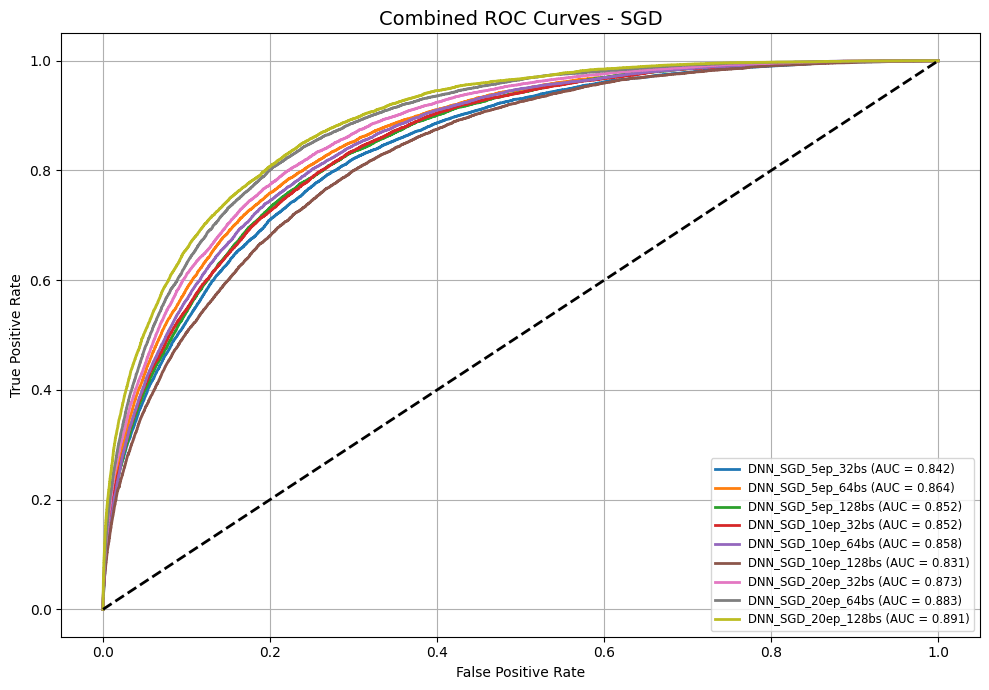

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


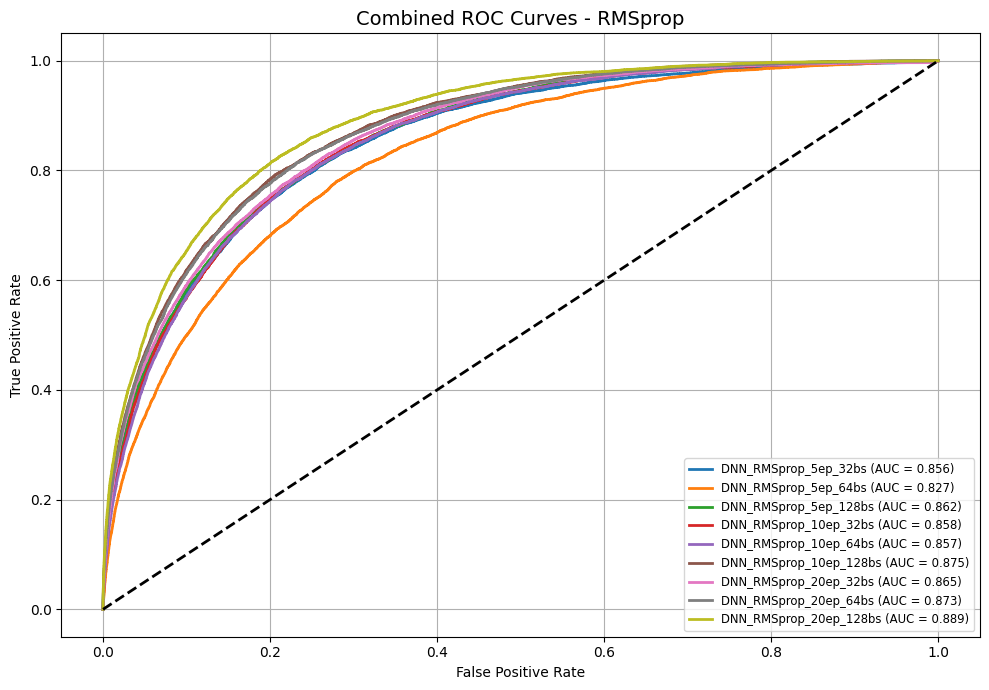

In [19]:
from sklearn.metrics import roc_curve, auc
from itertools import cycle
import matplotlib.pyplot as plt

# Group models by optimizer
optimizer_groups = {}
for key, entry in dnn.items():
    optimizer_name = key.split('_')[1]  # e.g., DNN_Adam_10ep_32bs -> Adam
    if optimizer_name not in optimizer_groups:
        optimizer_groups[optimizer_name] = []
    optimizer_groups[optimizer_name].append((key, entry))

# Plot ROC curves for each optimizer group
for optimizer, models_list in optimizer_groups.items():
    plt.figure(figsize=(10, 7))
    colors = cycle(plt.cm.tab10.colors)

    for key, entry in models_list:
        model = entry['model']
        y_score = model.predict(x_test)
        fpr, tpr, _ = roc_curve(y_test.ravel(), y_score.ravel())
        roc_auc = auc(fpr, tpr)

        plt.plot(fpr, tpr, lw=2, color=next(colors), label=f"{key} (AUC = {roc_auc:.3f})")

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.title(f"Combined ROC Curves - {optimizer}", fontsize=14)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc='lower right', fontsize='small')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━

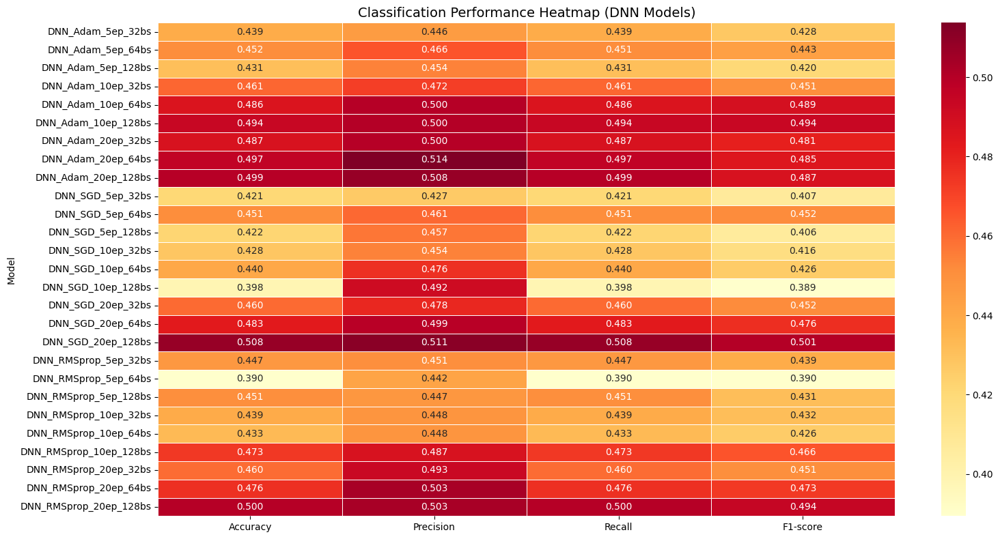

In [20]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Collect classification metrics
metrics_data = []

for key, entry in dnn.items():
    model = entry['model']
    y_pred_probs = model.predict(x_test)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = np.argmax(y_test, axis=1)

    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='macro', zero_division=0)
    rec = recall_score(y_true, y_pred, average='macro', zero_division=0)
    f1 = f1_score(y_true, y_pred, average='macro', zero_division=0)

    metrics_data.append({
        'Model': key,
        'Accuracy': acc,
        'Precision': prec,
        'Recall': rec,
        'F1-score': f1
    })

# Create DataFrame
metrics_df = pd.DataFrame(metrics_data)
metrics_df.set_index('Model', inplace=True)

# Plot heatmap
plt.figure(figsize=(16, 8))
sns.heatmap(metrics_df, annot=True, fmt=".3f", cmap="YlOrRd", linewidths=0.5)
plt.title("Classification Performance Heatmap (DNN Models)", fontsize=14)
plt.tight_layout()
plt.show()


In [21]:
# Choose best model based on F1-score
best_model_key = metrics_df['F1-score'].idxmax()
best_model = dnn[best_model_key]['model']

# Save model
best_model.save('best_dnn_model.h5')
print(f"Best model saved as 'best_dnn_model.h5': {best_model_key}")


Best model saved as 'best_dnn_model.h5': DNN_SGD_20ep_128bs


## CNN

In [4]:
from tensorflow.keras.layers import Conv2D, MaxPooling2D

configs = [
    {'optimizer': Adam(), 'name': 'Adam'},
    {'optimizer': SGD(learning_rate=0.01, momentum=0.9), 'name': 'SGD'},
    {'optimizer': RMSprop(learning_rate=0.001), 'name': 'RMSprop'}
]

epochs_list = [5,10, 20]
batch_sizes = [32, 64, 128]


def create_cnn_model(input_shape=(32, 32, 3), num_classes=10):
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),

        Flatten(),
        Dense(512, activation='relu'),
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])
    return model


I0000 00:00:1746800051.988358      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1746800051.988990      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


In [7]:
cnn = {}

for config in configs:
    for epochs in epochs_list:
        for batch_size in batch_sizes:
            print(f"\nTraining CNN - {config['name']}, {epochs} epochs, batch {batch_size}")
            
            # Create fresh CNN model
            model = create_cnn_model()

            # Clone optimizer
            current_optimizer = config['optimizer'].__class__.from_config(config['optimizer'].get_config())

            model.compile(optimizer=current_optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

            history = model.fit(
                x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                validation_data=(x_test, y_test),
                verbose=1
            )

            key = f"CNN_{config['name']}_{epochs}ep_{batch_size}bs"
            cnn[key] = {'model': model, 'history': history.history}



Training CNN - Adam, 5 epochs, batch 32
Epoch 1/5


I0000 00:00:1746800126.790695      95 service.cc:148] XLA service 0x7e071c00e460 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746800126.791568      95 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1746800126.791584      95 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1746800127.092549      95 cuda_dnn.cc:529] Loaded cuDNN version 90300


  70/1563 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1191 - loss: 2.2673

I0000 00:00:1746800129.891808      95 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1563/1563 ━━━━━━━━━━━━━━━━━━━━ 12s 4ms/step - accuracy: 0.3333 - loss: 1.7731 - val_accuracy: 0.5572 - val_loss: 1.2372
Epoch 2/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.5785 - loss: 1.1970 - val_accuracy: 0.6384 - val_loss: 1.0312
Epoch 3/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.6452 - loss: 1.0076 - val_accuracy: 0.6535 - val_loss: 0.9717
Epoch 4/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.6944 - loss: 0.8792 - val_accuracy: 0.6768 - val_loss: 0.9025
Epoch 5/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.7128 - loss: 0.8149 - val_accuracy: 0.7035 - val_loss: 0.8552

Training CNN - Adam, 5 epochs, batch 64
Epoch 1/5
782/782 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.3165 - loss: 1.8376 - val_accuracy: 0.5351 - val_loss: 1.2854
Epoch 2/5
782/782 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5518 - loss: 1.2532 - val_accuracy: 0.6181 - val_loss: 1.0722
Epoch 3/5
782/782 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6285

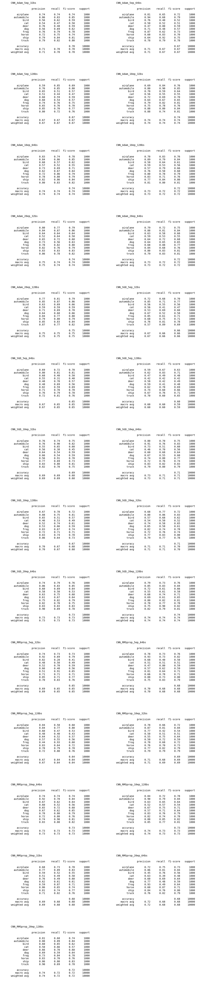

In [8]:
n_models = len(cnn)
n_cols = 2
n_rows = (n_models + n_cols - 1) // n_cols  # Calculate needed rows

plt.figure(figsize=(12, 4 * n_rows))  # Dynamic height based on number of models

for i, (model_name, model_data) in enumerate(cnn.items(), 1):
    model = model_data['model']
    y_pred = model.predict(x_test, verbose=0)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true = np.argmax(y_test, axis=1)
    
    plt.subplot(n_rows, n_cols, i)
    plt.text(0.1, 0.5, 
             f"{model_name}\n\n{classification_report(y_true, y_pred_classes, target_names=class_names, output_dict=False)}",
             fontfamily='monospace',
             fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()

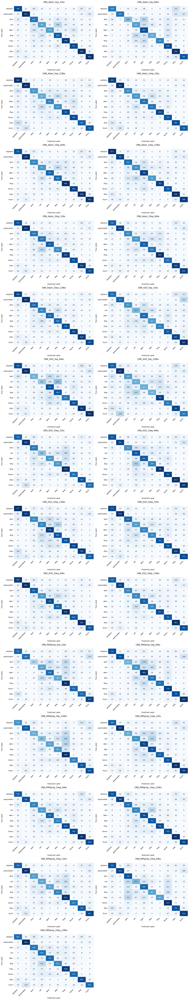

In [9]:
n_models = len(cnn)
cols = min(2, n_models)
rows = (n_models + cols - 1) // cols

plt.figure(figsize=(cols*8, rows*6))
for i, (model_name, model_data) in enumerate(cnn.items(), 1):
    model = model_data['model']
    y_pred = model.predict(x_test, verbose=0)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true = np.argmax(y_test, axis=1)
    
    cm = confusion_matrix(y_true, y_pred_classes)
    
    plt.subplot(rows, cols, i)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, 
                yticklabels=class_names,
                cbar=False)
    plt.title(model_name, pad=20)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)

plt.tight_layout()
plt.show()


 Accuracy Curves


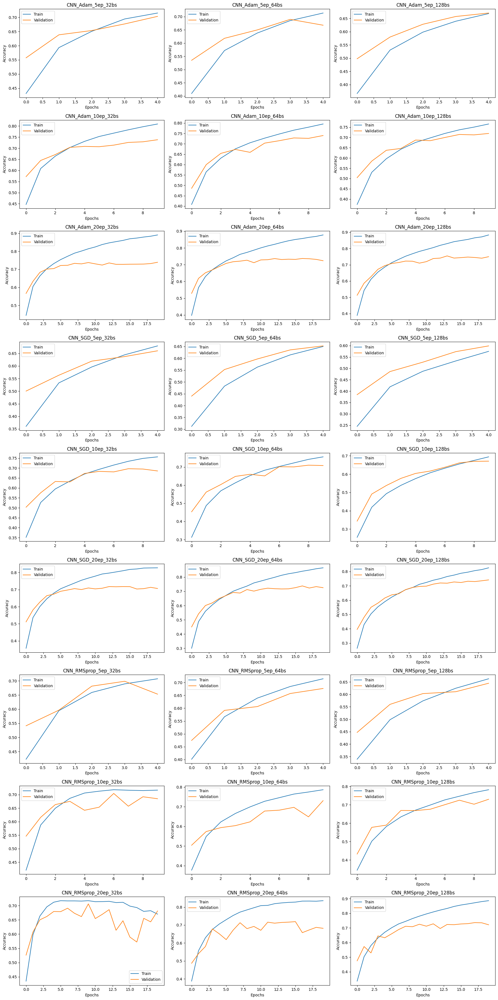


 Loss Curves


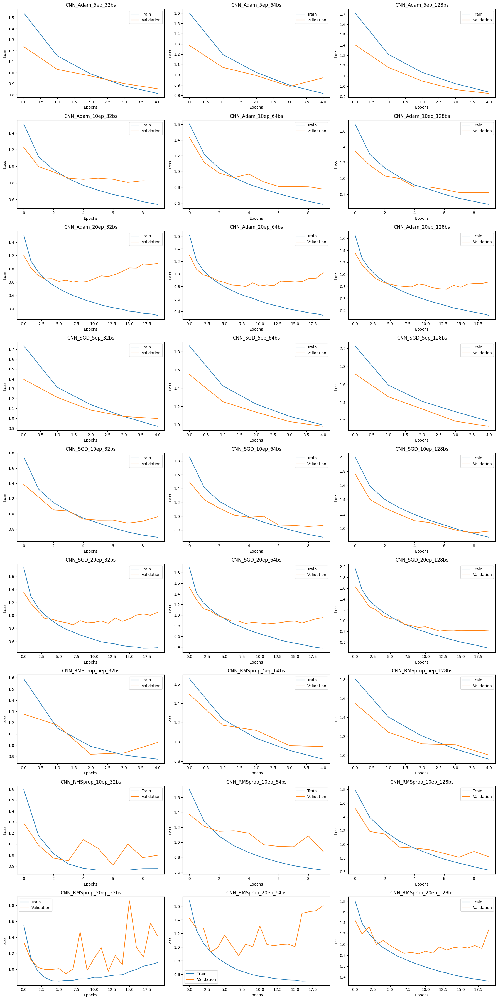

In [12]:
import math
def plot_metrics(results, metric='accuracy'):
    num_plots = len(results)
    cols = 3
    rows = math.ceil(num_plots / cols)

    plt.figure(figsize=(cols * 6, rows * 4))  # Adjust size as needed
    for i, (key, value) in enumerate(results.items()):
        history = value['history']
        plt.subplot(rows, cols, i + 1)
        plt.plot(history[metric], label='Train')
        plt.plot(history['val_' + metric], label='Validation')
        plt.title(key)
        plt.xlabel('Epochs')
        plt.ylabel(metric.capitalize())
        plt.legend()
        plt.tight_layout()
    plt.show()

# Plot accuracy
print("\n Accuracy Curves")

plot_metrics(cnn, metric='accuracy')
print("\n Loss Curves")
# Plot loss
plot_metrics(cnn, metric='loss')

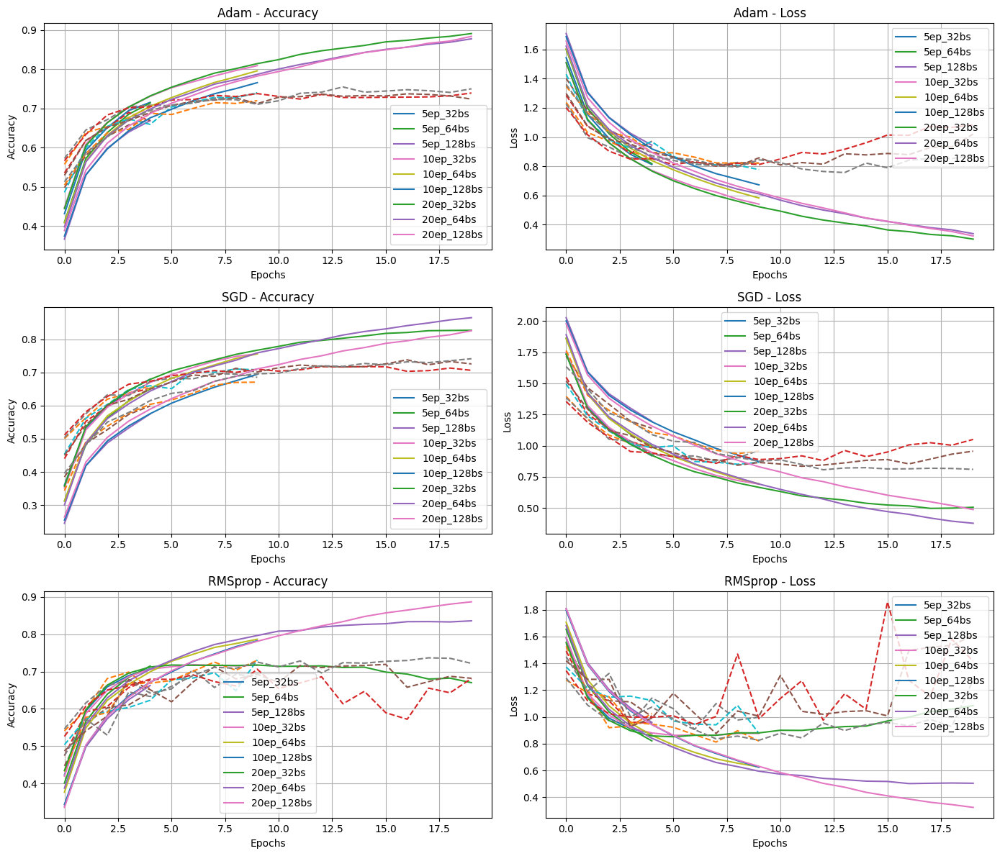

In [13]:
fig, axs = plt.subplots(3, 2, figsize=(14, 12))
optimizer_names = ['Adam', 'SGD', 'RMSprop']

for i, opt_name in enumerate(optimizer_names):
    ax_acc = axs[i][0]
    ax_loss = axs[i][1]
    ax_acc.set_title(f'{opt_name} - Accuracy')
    ax_loss.set_title(f'{opt_name} - Loss')
    
    for key in cnn:
        if f"CNN_{opt_name}" in key:
            history = cnn[key]['history']
            label = key.split('_', 2)[-1]
            ax_acc.plot(history['accuracy'], label=label)
            ax_acc.plot(history['val_accuracy'], linestyle='--')
            ax_loss.plot(history['loss'], label=label)
            ax_loss.plot(history['val_loss'], linestyle='--')
    
    ax_acc.set_ylabel('Accuracy')
    ax_loss.set_ylabel('Loss')
    ax_acc.set_xlabel('Epochs')
    ax_loss.set_xlabel('Epochs')
    ax_acc.grid(True)
    ax_loss.grid(True)
    ax_acc.legend()
    ax_loss.legend()

plt.tight_layout()
plt.show()


/tmp/ipykernel_31/2874942619.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


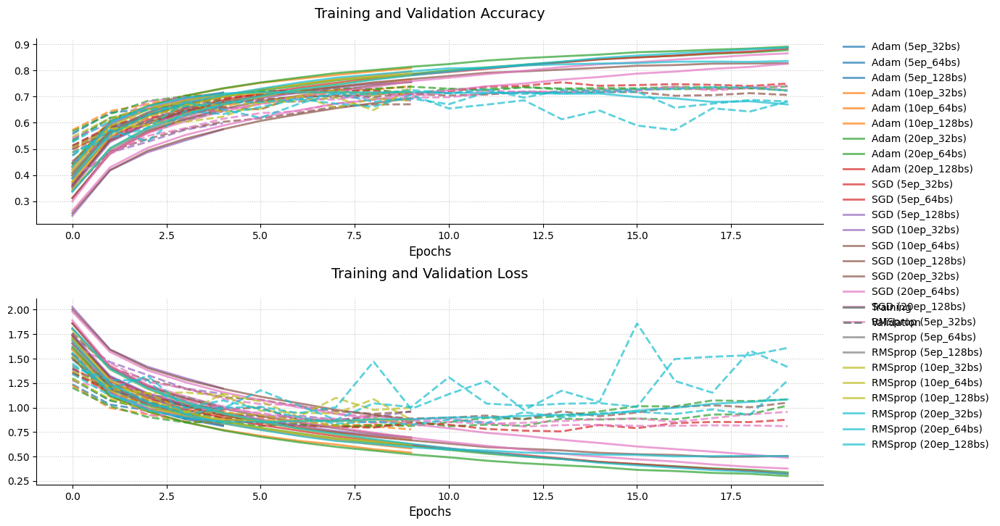

In [14]:
plt.figure(figsize=(14, 8))

# Create a grid of subplots with shared x-axis
gs = plt.GridSpec(2, 3, height_ratios=[1, 1], hspace=0.4, wspace=0.3)
ax_acc = plt.subplot(gs[0, :])  # Top row for accuracy
ax_loss = plt.subplot(gs[1, :])  # Bottom row for loss

# Custom color cycle for better distinction
colors = plt.cm.tab10(np.linspace(0, 1, len(cnn)))

for i, (key, model_data) in enumerate(cnn.items()):
    history = model_data['history']
    opt_name = key.split('_')[1]  # Get optimizer name
    label = f"{opt_name} ({key.split('_', 2)[-1]})"  # Combine optimizer and architecture
    
    # Plot accuracy
    ax_acc.plot(history['accuracy'], 
               color=colors[i], 
               linestyle='-', 
               linewidth=2, 
               alpha=0.7, 
               label=label)
    ax_acc.plot(history['val_accuracy'], 
               color=colors[i], 
               linestyle='--', 
               linewidth=2, 
               alpha=0.7)
    
    # Plot loss
    ax_loss.plot(history['loss'], 
                color=colors[i], 
                linestyle='-', 
                linewidth=2, 
                alpha=0.7, 
                label=label)
    ax_loss.plot(history['val_loss'], 
                color=colors[i], 
                linestyle='--', 
                linewidth=2, 
                alpha=0.7)

# Customize appearance
ax_acc.set_title('Training and Validation Accuracy', pad=20, fontsize=14)
ax_loss.set_title('Training and Validation Loss', pad=20, fontsize=14)

for ax in [ax_acc, ax_loss]:
    ax.set_xlabel('Epochs', fontsize=12)
    ax.grid(True, linestyle=':', alpha=0.7)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# Add legend outside the plot
handles, labels = ax_acc.get_legend_handles_labels()
unique_labels = list(dict.fromkeys(labels))  # Remove duplicates
ax_acc.legend(handles[:len(unique_labels)], unique_labels, 
             bbox_to_anchor=(1.02, 1), 
             loc='upper left', 
             borderaxespad=0.,
             frameon=False)

# Add validation indicator to legend
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color='gray', linestyle='-', lw=2),
                Line2D([0], [0], color='gray', linestyle='--', lw=2)]
ax_loss.legend(custom_lines, ['Training', 'Validation'], 
              bbox_to_anchor=(1.02, 1), 
              loc='upper left', 
              borderaxespad=0.,
              frameon=False)

plt.tight_layout()
plt.show()

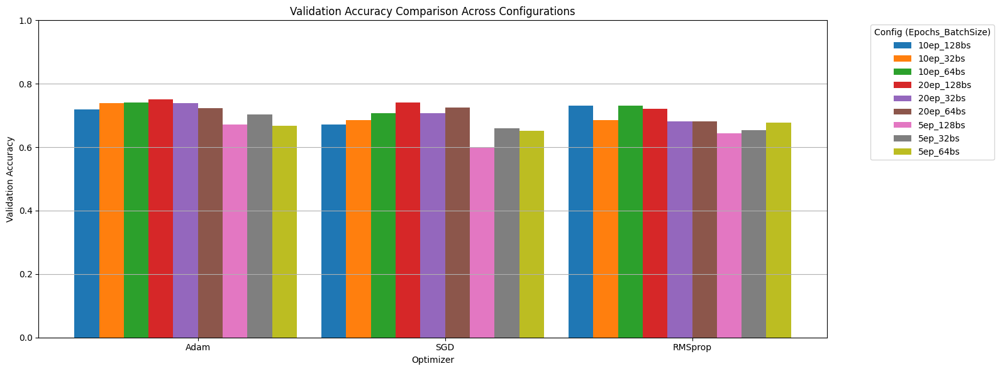

In [15]:
import matplotlib.pyplot as plt
import numpy as np

# Collect final validation accuracies for each optimizer and config
bar_data = {}

for key in cnn:
    parts = key.split('_')  
    opt_name = parts[1]
    config_label = parts[2] + '_' + parts[3]  
    val_acc = cnn[key]['history']['val_accuracy'][-1]

    if opt_name not in bar_data:
        bar_data[opt_name] = {}

    bar_data[opt_name][config_label] = val_acc

# Sort keys to maintain consistency
optimizers = list(bar_data.keys())
configs = sorted(list({cfg for opt in bar_data.values() for cfg in opt.keys()}))

# Prepare data matrix
val_acc_matrix = []
for opt in optimizers:
    val_acc_matrix.append([bar_data[opt].get(cfg, 0) for cfg in configs])

# Plotting
x = np.arange(len(optimizers))  # the label locations
width = 0.1  # width of individual bars

plt.figure(figsize=(16, 6))
for i, cfg in enumerate(configs):
    plt.bar(x + i * width, [val_acc_matrix[j][i] for j in range(len(optimizers))],
            width=width, label=cfg)

plt.ylabel('Validation Accuracy')
plt.xlabel('Optimizer')
plt.title('Validation Accuracy Comparison Across Configurations')
plt.xticks(x + width * (len(configs) / 2), optimizers)
plt.ylim([0, 1])
plt.legend(title='Config (Epochs_BatchSize)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


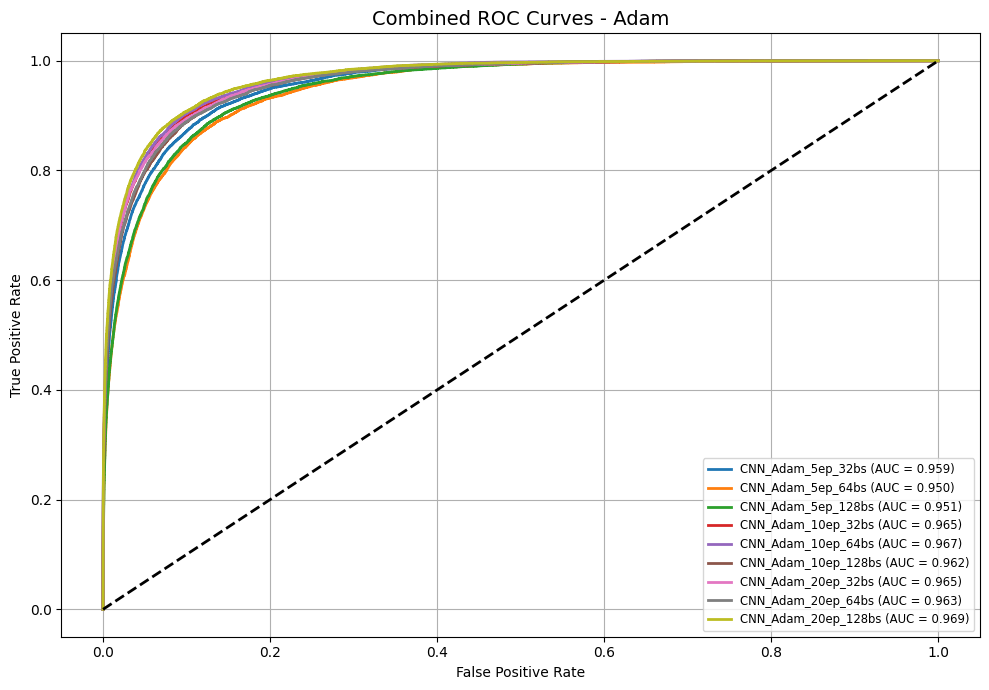

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


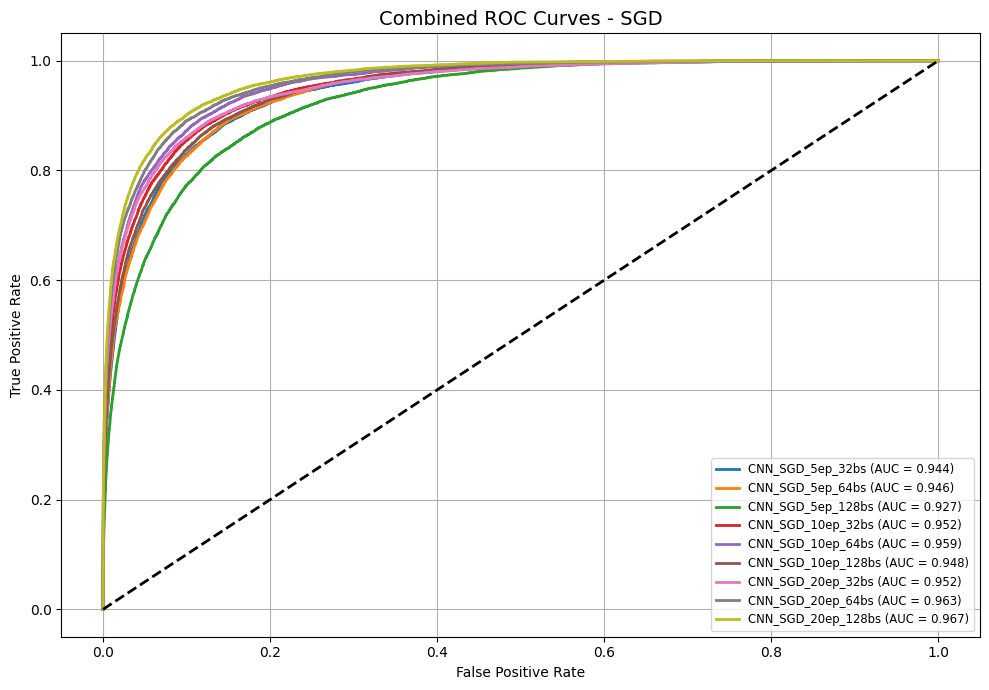

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


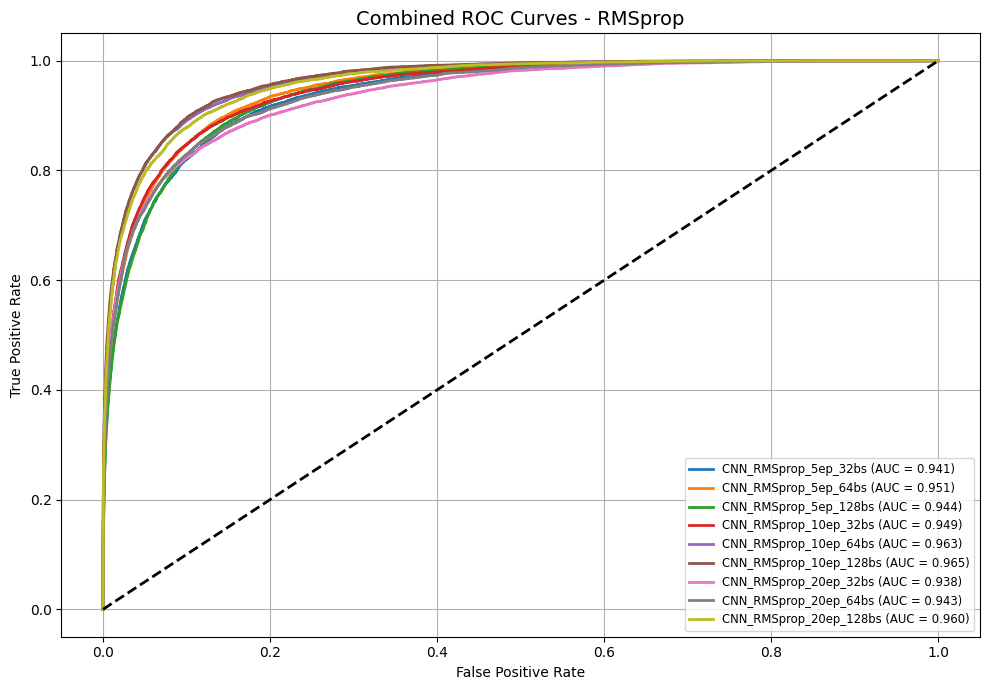

In [16]:
from sklearn.metrics import roc_curve, auc
from itertools import cycle
import matplotlib.pyplot as plt

# Group models by optimizer
optimizer_groups = {}
for key, entry in cnn.items():
    optimizer_name = key.split('_')[1]  # e.g., DNN_Adam_10ep_32bs -> Adam
    if optimizer_name not in optimizer_groups:
        optimizer_groups[optimizer_name] = []
    optimizer_groups[optimizer_name].append((key, entry))

# Plot ROC curves for each optimizer group
for optimizer, models_list in optimizer_groups.items():
    plt.figure(figsize=(10, 7))
    colors = cycle(plt.cm.tab10.colors)

    for key, entry in models_list:
        model = entry['model']
        y_score = model.predict(x_test)
        fpr, tpr, _ = roc_curve(y_test.ravel(), y_score.ravel())
        roc_auc = auc(fpr, tpr)

        plt.plot(fpr, tpr, lw=2, color=next(colors), label=f"{key} (AUC = {roc_auc:.3f})")

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.title(f"Combined ROC Curves - {optimizer}", fontsize=14)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc='lower right', fontsize='small')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━

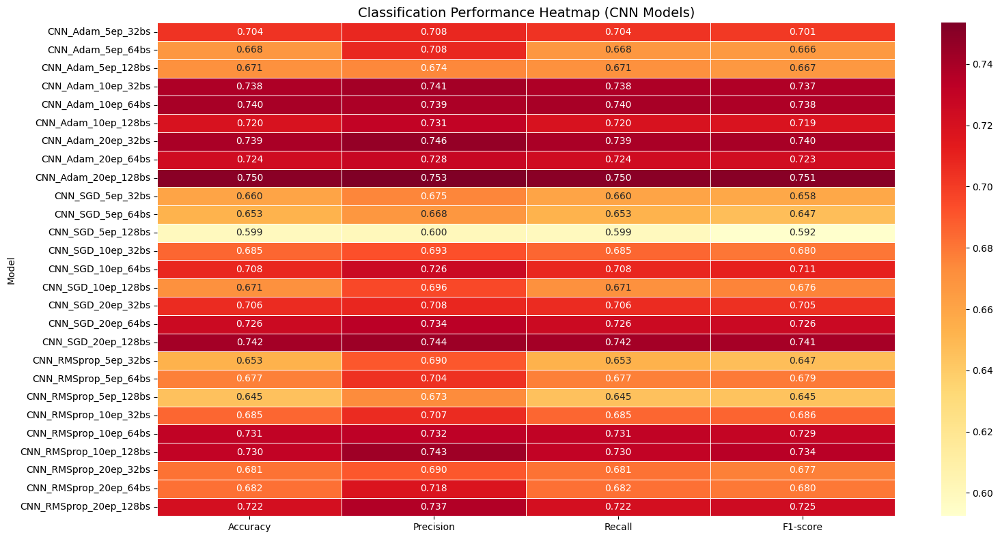

In [18]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Collect classification metrics
metrics_data = []

for key, entry in cnn.items():
    model = entry['model']
    y_pred_probs = model.predict(x_test)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = np.argmax(y_test, axis=1)

    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='macro', zero_division=0)
    rec = recall_score(y_true, y_pred, average='macro', zero_division=0)
    f1 = f1_score(y_true, y_pred, average='macro', zero_division=0)

    metrics_data.append({
        'Model': key,
        'Accuracy': acc,
        'Precision': prec,
        'Recall': rec,
        'F1-score': f1
    })

# Create DataFrame
metrics_df = pd.DataFrame(metrics_data)
metrics_df.set_index('Model', inplace=True)

# Plot heatmap
plt.figure(figsize=(16, 8))
sns.heatmap(metrics_df, annot=True, fmt=".3f", cmap="YlOrRd", linewidths=0.5)
plt.title("Classification Performance Heatmap (CNN Models)", fontsize=14)
plt.tight_layout()
plt.show()


In [19]:
# Choose best model based on F1-score
best_model_key = metrics_df['F1-score'].idxmax()
best_model = cnn[best_model_key]['model']

# Save model
best_model.save('best_cnn_model.h5')
print(f"Best model saved as 'best_cnn_model.h5': {best_model_key}")


Best model saved as 'best_cnn_model.h5': CNN_Adam_20ep_128bs


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


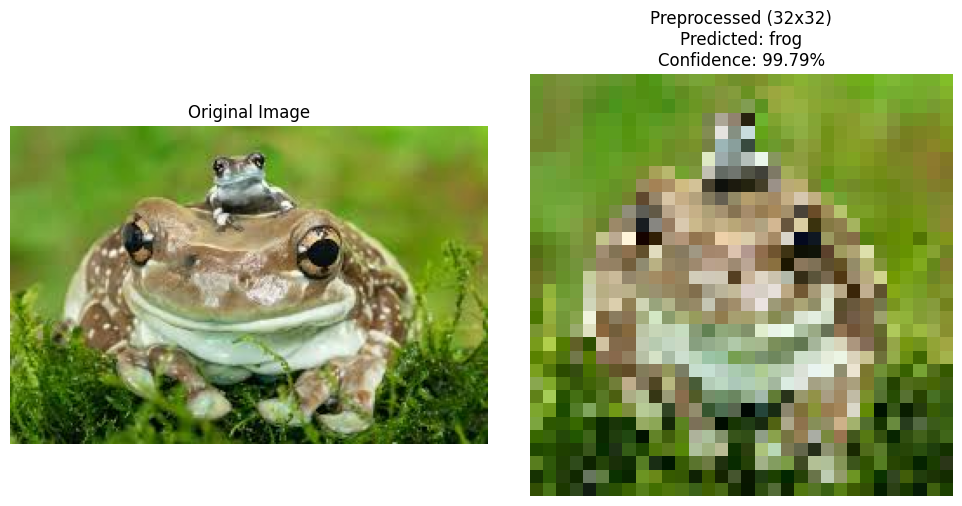

Predicted class: frog with 99.79% confidence


In [22]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras.preprocessing import image

# Load your saved model
model = keras.models.load_model('best_cnn_model.h5')

# CIFAR-10 class names
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

def predict_and_display(image_path):
    # Load the original image (for display)
    original_img = image.load_img(image_path)
    
    # Load and preprocess the image for prediction
    img = image.load_img(image_path, target_size=(32, 32))  # CIFAR-10 uses 32x32 images
    img_array = image.img_to_array(img)
    img_array = img_array.astype('float32') / 255.0  # Same normalization as training
    img_array = np.expand_dims(img_array, axis=0)   # Add batch dimension
    
    # Make prediction
    predictions = model.predict(img_array)
    predicted_class = np.argmax(predictions[0])
    confidence = np.max(predictions[0])
    
    # Create figure with two subplots
    plt.figure(figsize=(10, 5))
    
    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.axis('off')
    
    # Preprocessed image (32x32)
    plt.subplot(1, 2, 2)
    plt.imshow(img)
    plt.title(f"Preprocessed (32x32)\nPredicted: {class_names[predicted_class]}\nConfidence: {confidence:.2%}")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return class_names[predicted_class], confidence

# Example usage
image_path = '/kaggle/input/frog-test/ass4-test-frog.jpeg'  
predicted_class, confidence = predict_and_display(image_path)
print(f"Predicted class: {predicted_class} with {confidence:.2%} confidence")

# Conclusion

In this notebook, we trained multiple DNN and CNN models on inbuilt cifar10 dataset using different combinations of optimizers (Adam, SGD, RMSprop), batch sizes, and epochs. The best-performing CNN model used Adam optimizer, trained for 20 epochs with a batch size of 128, and achieved an accuracy of 0.750, precision of 0.753, recall of 0.750, and F1-score of 0.751. In contrast, the best DNN model,using sgd optimizer with the same configuration, reached only accuracy of 0.508, precision of 0.511, recall of 0.501, and F1-score of 0.501.
